# Sea Level Change Portal

This notebook was developed by JPL in September, 2022 to demonstrate the use of web services provided by the sea level change data platform.

#### Import Python packages

In [16]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import requests
from datetime import datetime

#### Import helper modules

In [17]:
import modules.plotting as plotting
import modules.processing as processing
import modules.algorithms as algorithms

In [18]:
%matplotlib inline

# Data Analysis Tool
___

## SLCP Data Inventory
___
We can see a list of datasets and their time ranges that have been ingested into the Data Analysis Tool

In [19]:
slcp_base_url = 'https://sealevel-dataservices.jpl.nasa.gov/nexus'
r = requests.get(f'{slcp_base_url}/list').json()

inv_df = pd.DataFrame(r)[['title', 'iso_start', 'iso_end']]
inv_df.sort_values('title')

,title,iso_start,iso_end
0,ALT_TIDE_GAUGE_L4_OST_SLA_US_WEST_COAST_V3,1993-01-01T12:00:00+0000,2016-12-01T12:00:00+0000
1,ALT_TIDE_GAUGE_L4_OST_SLA_US_WEST_COAST_V3_clim,1970-01-16T00:00:00+0000,1970-12-16T00:00:00+0000
2,AP_iceshelf_firn,1994-01-15T00:00:00+0000,2016-10-15T00:00:00+0000
3,AP_iceshelf_heights,1994-01-15T00:00:00+0000,2017-04-15T00:00:00+0000
4,AP_iceshelf_mass_balance,1994-01-01T00:00:00+0000,2016-10-01T00:00:00+0000
...,...,...,...
1470,oceTAUE_ECCO_version4_release4_clim,1970-01-16T00:00:00+0000,1970-12-16T00:00:00+0000
1471,oceTAUN_ECCO_version4_release4,1992-01-16T18:00:00+0000,2017-12-16T06:00:00+0000
1472,oceTAUN_ECCO_version4_release4_clim,1970-01-16T00:00:00+0000,1970-12-16T00:00:00+0000
1473,sIceLoad_ECCO_version4_release4,1992-01-16T18:00:00+0000,2017-12-16T06:00:00+0000


## Compare ECCO SSH and MEaSUREs Satellite Product

### Comparison parameters
___
We select the dataset(s), temporal bounds, and spatial bounds for data available in the Data Analysis Tool

In [20]:
title = processing.search_inventory(inv_df, 'title', 'sea surface height')
title

['SEA_SURFACE_HEIGHT_ALT_GRIDS_L4_2SATS_5DAY_6THDEG_V_JPL1812_1x1Monthly',
 'SEA_SURFACE_HEIGHT_ALT_GRIDS_L4_2SATS_5DAY_6THDEG_V_JPL2205_Monthly']

In [21]:
title = processing.search_inventory(inv_df, 'title', 'ecco SSH')
title

['SSHIBC_ECCO_version4_release4',
 'SSHNOIBC_ECCO_version4_release4',
 'SSH_ECCO_version4_release4']

In [22]:
# Dataset names ingested into data analysis tool
ecco_ssh_ds = 'SSH_ECCO_version4_release4'
measures_ssh_ds = 'SEA_SURFACE_HEIGHT_ALT_GRIDS_L4_2SATS_5DAY_6THDEG_V_JPL2205_Monthly'

# Temporal bounds
start_time = datetime(1992,10,1)
end_time = datetime(2018,1,1)

# Spatial bounding box
bb = {
    'min_lon': -150,
    'max_lon': -77,
    'min_lat': -8,
    'max_lat': 8
}

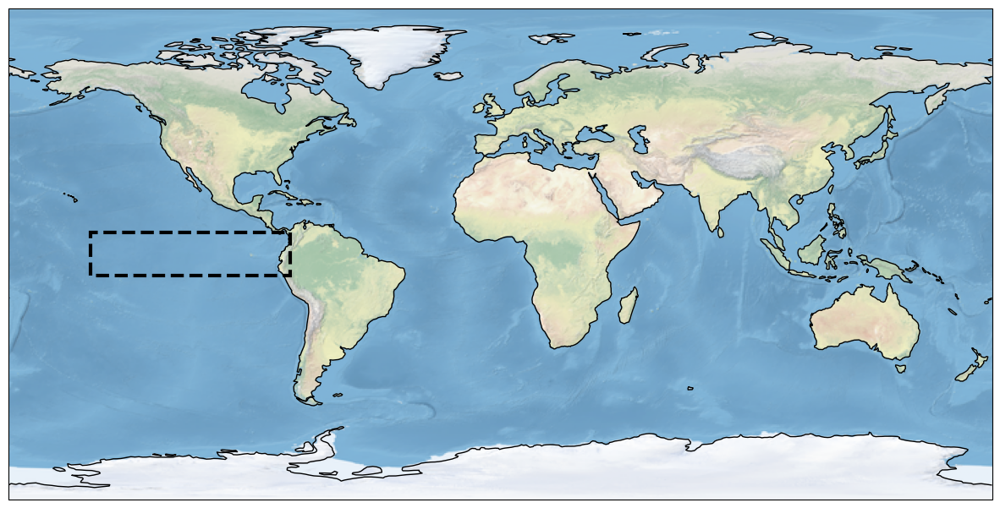

In [23]:
# Plot a box around our spatial bounds
plotting.plot_box(bb)

### Get timeseries spatial mean data from SDAP
___
We execute timeseries analysis based on our selected parameters, and format the results for plotting

In [24]:
# Get timeseries results from data analysis tool
ecco_ssh_ts = algorithms.spatial_mean(slcp_base_url, ecco_ssh_ds, bb, start_time, end_time)
measures_ts = algorithms.spatial_mean(slcp_base_url, measures_ssh_ds, bb, start_time, end_time)

https://sealevel-dataservices.jpl.nasa.gov/nexus/timeSeriesSpark?ds=SSH_ECCO_version4_release4&minLon=-150&minLat=-8&maxLon=-77&maxLat=8&startTime=1992-10-01T00:00:00Z&endTime=2018-01-01T00:00:00Z
Waiting for response from data analysis tool...
Time series took 3.845 seconds

https://sealevel-dataservices.jpl.nasa.gov/nexus/timeSeriesSpark?ds=SEA_SURFACE_HEIGHT_ALT_GRIDS_L4_2SATS_5DAY_6THDEG_V_JPL2205_Monthly&minLon=-150&minLat=-8&maxLon=-77&maxLat=8&startTime=1992-10-01T00:00:00Z&endTime=2018-01-01T00:00:00Z
Waiting for response from data analysis tool...
Time series took 10.103 seconds



In [25]:
# A look at the raw JSON results returned from the algorithm
ecco_ssh_ts

{'meta': [{'shortName': 'SSH_ECCO_version4_release4',
   'bounds': {'east': -77.0, 'west': -150.0, 'north': 8.0, 'south': -8.0},
   'time': {'start': 717897600,
    'stop': 1514764800,
    'iso_start': '1992-10-01T00:00:00+0000',
    'iso_stop': '2018-01-01T00:00:00+0000'}}],
 'data': [[{'min': 0.2067360132932663,
    'max': 0.6716718077659607,
    'mean': 0.4079989492893219,
    'cnt': 4520,
    'std': 0.11302413941059303,
    'time': 719236800,
    'iso_time': '1992-10-16T12:00:00+0000',
    'meanLowPass': 0.41230993754982076,
    'maxLowPass': 0.6764184956124198,
    'minLowPass': 0.2094650864057623,
    'ds': 0}],
  [{'min': 0.18847554922103882,
    'max': 0.688926100730896,
    'mean': 0.4128769636154175,
    'cnt': 4520,
    'std': 0.11742640501333727,
    'time': 721872000,
    'iso_time': '1992-11-16T00:00:00+0000',
    'meanLowPass': 0.41468348348573003,
    'maxLowPass': 0.6792764634464933,
    'minLowPass': 0.21723069873882556,
    'ds': 0}],
  [{'min': 0.2357943207025528,
 

In [26]:
# Prepare data analysis tool results for plotting
ecco_ssh_da = processing.prep_ts(ecco_ssh_ts)
measures_da = processing.prep_ts(measures_ts)

# Remove seasonal cycle
ecco_ssh_anoms = processing.calc_clim_anoms(ecco_ssh_da)
measures_anoms = processing.calc_clim_anoms(measures_da)

# Get rolling averages of anomalies
ecco_ssh_avg = processing.rolling_avg(ecco_ssh_anoms)
measures_avg = processing.rolling_avg(measures_anoms)

### Plot comparison of the anomalies

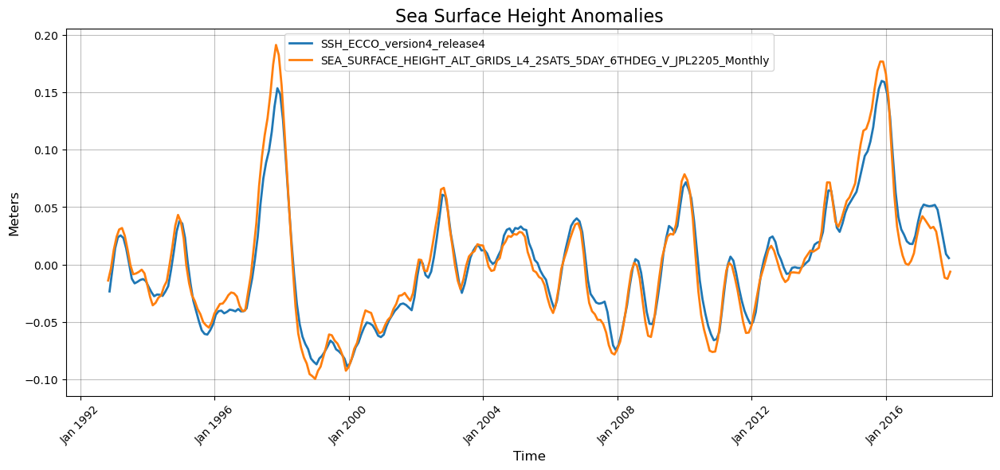

In [27]:
# Plot comparison of ecco and measures rolling average anomalies
plot_title = 'Sea Surface Height Anomalies'
units = 'Meters'
plotting.comparison_plot([ecco_ssh_avg, measures_avg], x_label='Time', y_label=units, title=plot_title)

### Time Average
___
We execute a time average analysis based on our selected parameters and prepare the results for plotting

In [28]:
# Get time average results from data analysis tool
ecco_time_avg = algorithms.time_avg_map(slcp_base_url, ecco_ssh_ds, bb, start_time, end_time)

https://sealevel-dataservices.jpl.nasa.gov/nexus/timeAvgMapSpark?ds=SSH_ECCO_version4_release4&minLon=-150&minLat=-8&maxLon=-77&maxLat=8&startTime=1992-10-01T00:00:00Z&endTime=2018-01-01T00:00:00Z
Waiting for response from data analysis tool...
Time average took 6.307 seconds



In [29]:
# Prepare data analysis tool results for plotting
ecco_time_avg_da = processing.prep_avg_map(ecco_time_avg, 'm')

### Plot time average map

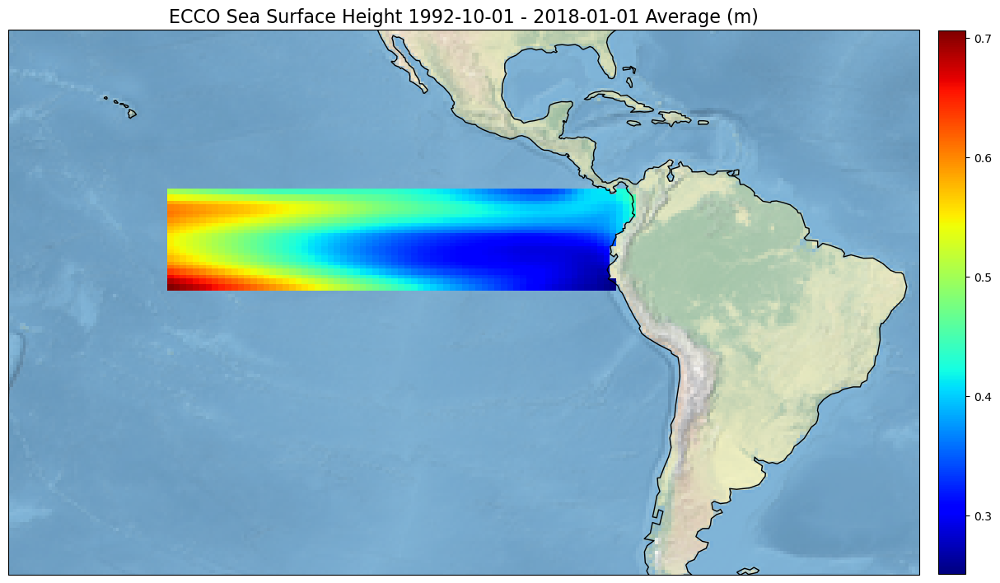

In [30]:
map_title = f'ECCO Sea Surface Height {str(start_time)[:10]} - {str(end_time)[:10]} Average ({ecco_time_avg_da.attrs["units"]})'
plotting.plot_map(ecco_time_avg_da, map_title)

## Compare ECCO OBP and GRACE (TELLUS GRAC MASCON RL06 V2) Product

In [31]:
title = processing.search_inventory(inv_df, 'title', 'mascon')
title

['CSR-RL06-Mascons-v02_LAND',
 'CSR-RL06-Mascons-v02_OCEAN',
 'TELLUS_GRAC-GRFO_MASCON_CRI_GRID_RL06_V2_LAND',
 'TELLUS_GRAC-GRFO_MASCON_CRI_GRID_RL06_V2_OCEAN']

In [32]:
ecco_obp_ds = 'OBP_ECCO_version4_release4'
grace_obp_ds = 'TELLUS_GRAC-GRFO_MASCON_CRI_GRID_RL06_V2_OCEAN'

# Temporal bounds
start_time = datetime(2006,10,1)
end_time = datetime(2018,1,1)

# Spatial bounding box
bb = {
    'min_lon': -150,
    'max_lon': -77,
    'min_lat': -8,
    'max_lat': 8
}

units = 'Meters'

### Get timeseries data from data analysis tool

In [33]:
# Get timeseries from data analysis tool
ecco_obp_ts = algorithms.spatial_mean(slcp_base_url, ecco_obp_ds, bb, start_time, end_time)
grace_obp_ts = algorithms.spatial_mean(slcp_base_url, grace_obp_ds, bb, start_time, end_time)

https://sealevel-dataservices.jpl.nasa.gov/nexus/timeSeriesSpark?ds=OBP_ECCO_version4_release4&minLon=-150&minLat=-8&maxLon=-77&maxLat=8&startTime=2006-10-01T00:00:00Z&endTime=2018-01-01T00:00:00Z
Waiting for response from data analysis tool...
Time series took 1.521 seconds

https://sealevel-dataservices.jpl.nasa.gov/nexus/timeSeriesSpark?ds=TELLUS_GRAC-GRFO_MASCON_CRI_GRID_RL06_V2_OCEAN&minLon=-150&minLat=-8&maxLon=-77&maxLat=8&startTime=2006-10-01T00:00:00Z&endTime=2018-01-01T00:00:00Z
Waiting for response from data analysis tool...
Time series took 0.890 seconds



In [34]:
ecco_obp_da = processing.prep_ts(ecco_obp_ts, [processing.ecco_grace])
grace_da = processing.prep_ts(grace_obp_ts, [processing.grac_mascon])

### Plot a comparison of the anomalies

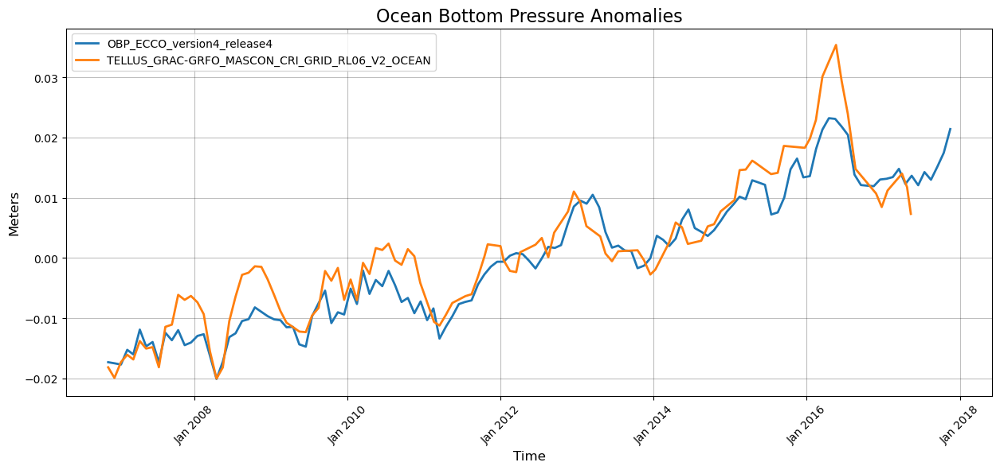

In [35]:
plotting.comparison_plot([ecco_obp_da, grace_da], x_label='Time', y_label=units, title='Ocean Bottom Pressure Anomalies')

### Plot a comparison of OBP with SSH

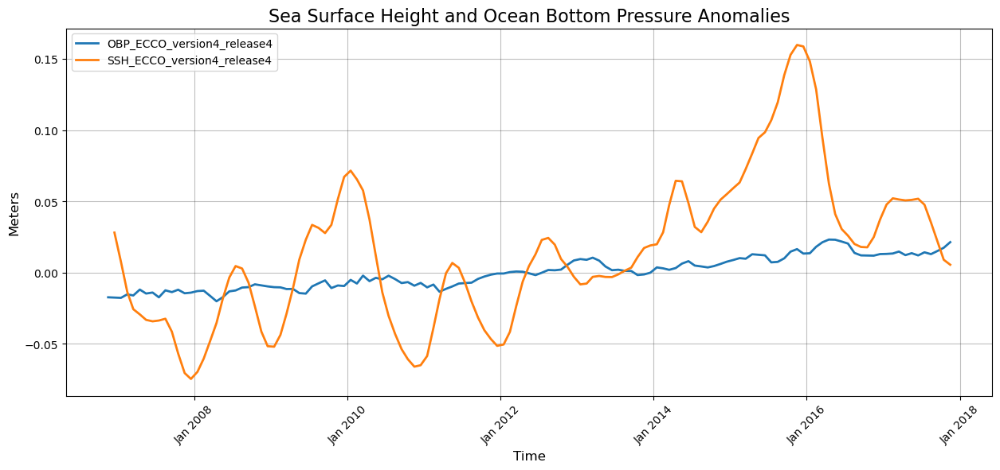

In [36]:
plotting.comparison_plot([ecco_obp_da, ecco_ssh_avg[170:]], x_label='Time', y_label=units, title='Sea Surface Height and Ocean Bottom Pressure Anomalies')

## ECCO Temperature and SSH

### Timeseries per depth level

In [37]:
results = []
for i in range(15):
    ecco_temp_dataset = f'THETA_ECCO_version4_release4_D{i}'
    ecco_temp_ts = algorithms.spatial_mean(slcp_base_url, ecco_temp_dataset, bb, 
                                            start_time, end_time)
    results.append(processing.prep_ts(ecco_temp_ts, [processing.ecco_theta]))
ecco_temp_da = processing.merge_depth_results(results)

https://sealevel-dataservices.jpl.nasa.gov/nexus/timeSeriesSpark?ds=THETA_ECCO_version4_release4_D0&minLon=-150&minLat=-8&maxLon=-77&maxLat=8&startTime=2006-10-01T00:00:00Z&endTime=2018-01-01T00:00:00Z
Waiting for response from data analysis tool...
Time series took 0.995 seconds

https://sealevel-dataservices.jpl.nasa.gov/nexus/timeSeriesSpark?ds=THETA_ECCO_version4_release4_D1&minLon=-150&minLat=-8&maxLon=-77&maxLat=8&startTime=2006-10-01T00:00:00Z&endTime=2018-01-01T00:00:00Z
Waiting for response from data analysis tool...
Time series took 0.903 seconds

https://sealevel-dataservices.jpl.nasa.gov/nexus/timeSeriesSpark?ds=THETA_ECCO_version4_release4_D2&minLon=-150&minLat=-8&maxLon=-77&maxLat=8&startTime=2006-10-01T00:00:00Z&endTime=2018-01-01T00:00:00Z
Waiting for response from data analysis tool...
Time series took 0.937 seconds

https://sealevel-dataservices.jpl.nasa.gov/nexus/timeSeriesSpark?ds=THETA_ECCO_version4_release4_D3&minLon=-150&minLat=-8&maxLon=-77&maxLat=8&startTime=20

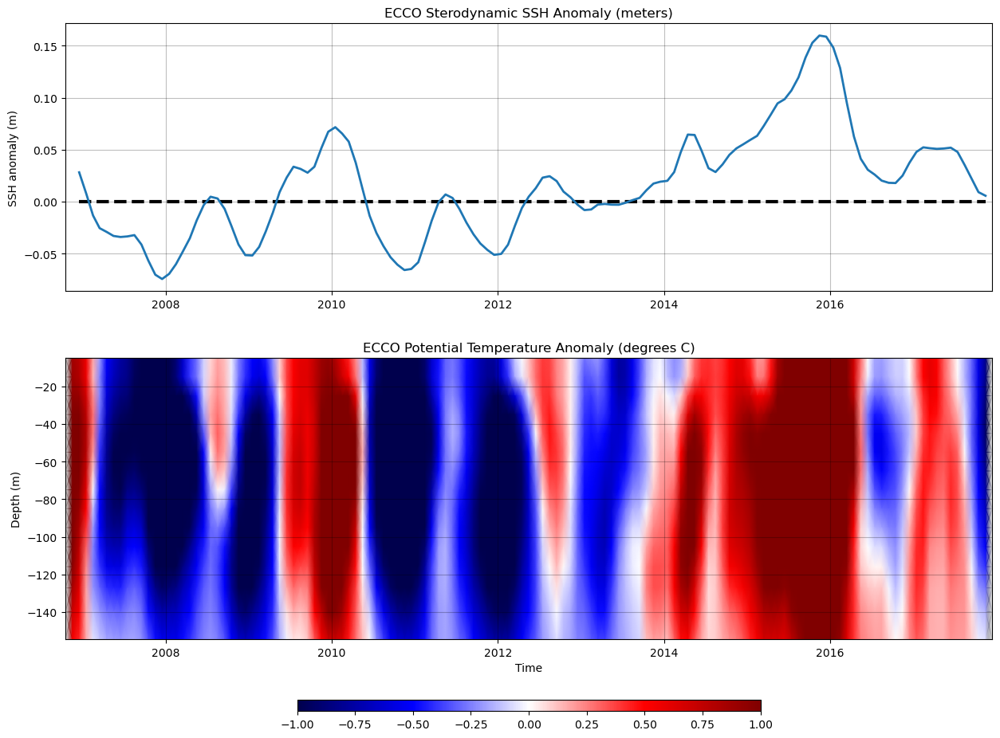

In [38]:
plotting.ssh_temp_plot(ecco_ssh_avg[170:], ecco_temp_da)

## Connect to OnEarth backend for visualization

In [39]:
dates = [f'{k}-{m:02d}-15' for k in range(2016,2018) for m in range(1,13)]
ecco_frames = [plotting.get_ecco_tiles(d) for d in dates]

Getting tile imagery from https://sealevel-dataservices.jpl.nasa.gov/onearth/wmts/epsg4326/all//SSH_ECCO_version4_release4/default/2016-01-15/4km/2/
Getting tile imagery from https://sealevel-dataservices.jpl.nasa.gov/onearth/wmts/epsg4326/all//SSH_ECCO_version4_release4/default/2016-02-15/4km/2/
Getting tile imagery from https://sealevel-dataservices.jpl.nasa.gov/onearth/wmts/epsg4326/all//SSH_ECCO_version4_release4/default/2016-03-15/4km/2/
Getting tile imagery from https://sealevel-dataservices.jpl.nasa.gov/onearth/wmts/epsg4326/all//SSH_ECCO_version4_release4/default/2016-04-15/4km/2/
Getting tile imagery from https://sealevel-dataservices.jpl.nasa.gov/onearth/wmts/epsg4326/all//SSH_ECCO_version4_release4/default/2016-05-15/4km/2/
Getting tile imagery from https://sealevel-dataservices.jpl.nasa.gov/onearth/wmts/epsg4326/all//SSH_ECCO_version4_release4/default/2016-06-15/4km/2/
Getting tile imagery from https://sealevel-dataservices.jpl.nasa.gov/onearth/wmts/epsg4326/all//SSH_ECCO_v

### Plot animation of ECCO SSH data for 2017

In [40]:
from matplotlib import animation
from matplotlib import pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
plt.rcParams["animation.html"] = "jshtml"
colors = ['navy', 'blue',  'royalblue', 'paleturquoise', 'lightcyan', 'yellow', 'orange', 'red', 'darkred']
newcmp = LinearSegmentedColormap.from_list("", colors)
with plt.ioff():
    fig = plt.figure(figsize=(10,5))

    im = plt.imshow(ecco_frames[0])
    plt.title(f'ECCO SSH {dates[0]}', fontsize=20)

    plt.ylim(1300,0)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    sm = plt.cm.ScalarMappable(cmap=newcmp)
    sm.set_clim(vmin=-1, vmax=1)
    plt.colorbar(sm)

    def animate(i):
        im.set_array(ecco_frames[i])
        plt.title(f'ECCO SSH {dates[i]}', fontsize=20)
        return [im]

    ani = animation.FuncAnimation(fig, animate, frames=len(ecco_frames), 
                            interval=150, blit=True, repeat=True)

In [41]:
ani

In [42]:
plt.close()

# Northeastern Virginia, USA sea level analysis using IPCC and SEA tools


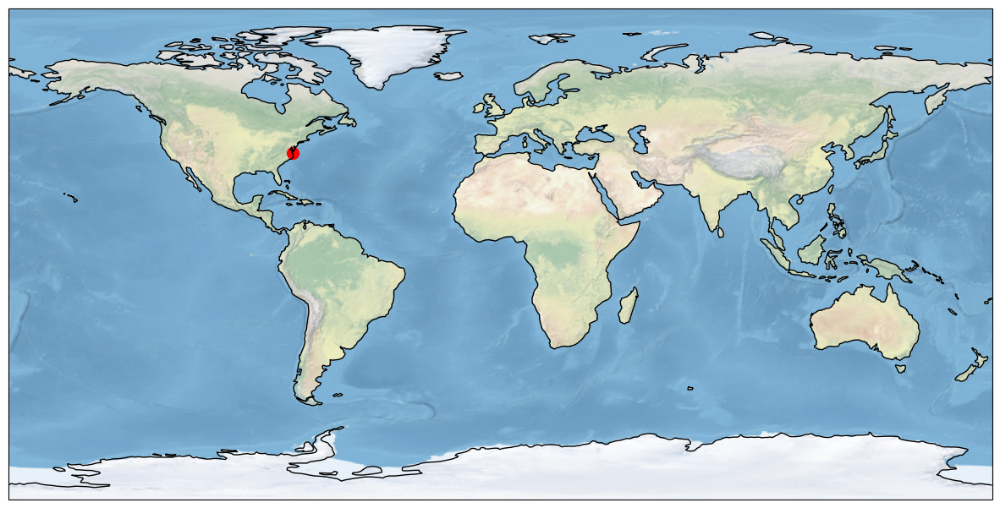

In [43]:
lat, lon = 37, -76
plotting.plot_point(lat, lon)

# Sea Level Evaluation & Assessment Tool

### Connect to SEA backend
___
We query SEA for all available tide gauge data and format it into a Pandas DataFrame

In [44]:
sea_base_url = 'https://sealevel-dataservices.jpl.nasa.gov/edge/ws/search/tidegauge'
r = requests.get(sea_base_url)

In [45]:
props = [f['properties'] for f in r.json()['features']]
sea_df = pd.DataFrame(props)
sea_df

,type,name,psmsl_id,url,coastline_code,station_code,country,time_span_of_data,completeness,date_of_last_update,...,vlm_unc,sterodynamic_trend,sterodynamic_unc,sal,sal_unc,sum,sum_unc,residual,residual_unc,reconstructed_trend
0,tide_gauge,ONISAKI,1026,https://www.psmsl.org/data/obtaining/stations/...,642,128,Japan,1963 – 2020,99.0,03 Mar 2021,...,0.316,1.926020,0.490263,2.080762,0.190608,-1.214210,0.591425,-0.401853,0.801249,4.006782
1,tide_gauge,OSHORO II,1027,https://www.psmsl.org/data/obtaining/stations/...,641,42,Japan,1963 – 2020,100.0,03 Mar 2021,...,0.528,0.442146,0.327245,2.129816,0.192336,-0.844347,0.681802,1.776880,0.678169,2.571962
2,tide_gauge,SAN FRANCISCO,10,https://www.psmsl.org/data/obtaining/stations/...,823,31,United States,1854 – 2020,100.0,02 Feb 2021,...,0.351,0.134363,0.848439,1.812051,0.173124,1.887840,0.959126,-0.605314,0.641942,1.946415
3,tide_gauge,BREST,1,https://www.psmsl.org/data/obtaining/stations/...,190,91,France,1807 – 2020,90.0,06 May 2021,...,0.227,0.141824,0.300264,1.565905,0.176479,2.120420,0.630292,-0.250422,0.510638,1.707729
4,tide_gauge,SAN JUAN,1001,https://www.psmsl.org/data/obtaining/stations/...,938,21,Puerto Rico,1962 – 2020,91.0,02 Feb 2021,...,0.430,1.140430,0.741311,1.929388,0.183732,2.873010,0.858942,0.601412,0.625794,3.069818
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
583,tide_gauge,CADIZ III,985,https://www.psmsl.org/data/obtaining/stations/...,220,3,Spain,1961 – 2018,97.0,14 Mar 2019,...,0.275,0.968632,0.310201,1.727576,0.182703,2.101170,0.568874,-0.903691,1.100365,2.696208
584,tide_gauge,ULSAN,997,https://www.psmsl.org/data/obtaining/stations/...,620,51,"Korea, Republic Of",1962 – 2019,97.0,02 Sep 2020,...,0.513,1.741960,0.292763,2.026926,0.183676,4.182950,0.632741,-0.315196,1.035549,3.768886
585,tide_gauge,BELLA BELLA,984,https://www.psmsl.org/data/obtaining/stations/...,822,16,Canada,1961 – 2020,96.0,14 Sep 2021,...,0.403,0.282002,0.742612,1.526826,0.161887,0.387669,1.048467,0.096194,0.595535,1.808828
586,tide_gauge,PORT TARANAKI,996,https://www.psmsl.org/data/obtaining/stations/...,690,81,New Zealand,1955 – 2020,81.0,19 Aug 2021,...,0.280,3.003020,0.794695,1.437533,0.159404,5.534820,0.852745,-2.710020,0.940832,4.440553


### Search the DataFrame for the tide gauge corresponding to Sewells Point, Hampton Roads in northeastern Virginia, USA

In [46]:
# Find the id for the tide gauge at Sewells Point, Hampton Roads
matches = processing.search_inventory(sea_df, 'name', 'sewells point')
matches

['SEWELLS POINT, HAMPTON ROADS']

In [47]:
name = matches[0]
ne_va_df = sea_df[sea_df['name'] == name]
ne_va_id = ne_va_df['psmsl_id']
ne_va_df

,type,name,psmsl_id,url,coastline_code,station_code,country,time_span_of_data,completeness,date_of_last_update,...,vlm_unc,sterodynamic_trend,sterodynamic_unc,sal,sal_unc,sum,sum_unc,residual,residual_unc,reconstructed_trend
387,tide_gauge,"SEWELLS POINT, HAMPTON ROADS",299,https://www.psmsl.org/data/obtaining/stations/...,960,71,United States,1927 – 2020,99.0,02 Feb 2021,...,0.384,2.73433,1.3783,1.762996,0.170016,6.81394,1.53554,-1.49507,1.381101,4.497326


### Get the data for Sewells Point, Hampton Roads in Northeastern Virginia
___
We use the psmsl id for Sewells Point, Hampton Roads to obtain the data for that tide gauge

In [48]:
# Get the data from SEA
params = {
    'psmsl_id': ne_va_id
}
r = requests.get(f'{sea_base_url}', params=params).json()

In [49]:
r

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'geometry': {'type': 'Point', 'coordinates': [-76.33, 36.946667]},
   'properties': {'type': 'tide_gauge',
    'name': 'SEWELLS POINT, HAMPTON ROADS',
    'psmsl_id': 299,
    'url': 'https://www.psmsl.org/data/obtaining/stations/299.php',
    'coastline_code': 960,
    'station_code': 71,
    'country': 'United States',
    'time_span_of_data': '1927 – 2020',
    'completeness': 99.0,
    'date_of_last_update': '02 Feb 2021',
    'measured_tg_rate': 5.57453,
    'measured_tg_unc': 1.19733,
    'vlm_trend': -2.649,
    'vlm_unc': 0.384,
    'sterodynamic_trend': 2.73433,
    'sterodynamic_unc': 1.3783,
    'sal': 1.7629963,
    'sal_unc': 0.17001559,
    'sum': 6.81394,
    'sum_unc': 1.5355397,
    'residual': -1.49507,
    'residual_unc': 1.3811007,
    'reconstructed_trend': 4.4973264,
    'tide_gauge_time_series': {'x': [1993.042,
      1993.125,
      1993.208,
      1993.292,
      1993.375,
      1993.458,
      

### Prepare data in format for plotting

In [50]:
sea_results = processing.prep_sea(r)

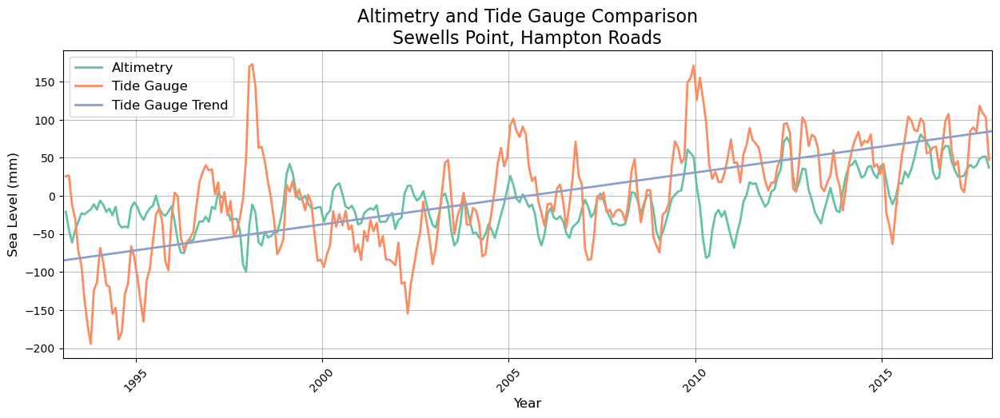

In [51]:
plotting.sea_plot(sea_results, rolling=True)

In [52]:
from matplotlib import animation
from matplotlib import pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
plt.rcParams["animation.html"] = "jshtml"

with plt.ioff():
    fig = plt.figure(figsize=(10,5))
    cmap = plt.get_cmap("Set2")
    keys = ['Tide Gauge', 'Tide Gauge (subsidence corrected)']
    def animate(i):
        fig.clear()
        if i == 0:
                k1 = 'Tide Gauge'
                k2 = 'Tide Gauge Trend'
        else:   
                k1 = 'Tide Gauge (subsidence corrected)'
                k2 = 'Tide Gauge Trend (subsidence corrected)'
        plt.plot(sea_results[k1].time, sea_results[k1].values, color=cmap(2), linewidth=2, label=k1)
        plt.plot(sea_results[k2].time, sea_results[k2].values, color=cmap(3), linewidth=2, label=k2)
        plt.title(f'Tide Gauge with and without subsidence correction', fontsize=16)
        plt.tight_layout()
        plt.grid(which='major', color='k', linestyle='-', zorder=0, alpha=0.25)
        plt.ylim(-250, 400)
        plt.legend()
        return []
    ani = animation.FuncAnimation(fig, animate, frames=2, interval=1500, repeat=True)

In [53]:
ani

In [54]:
plt.close()

# IPCC TOOL

### Connect to IPCC backend
___
We use the Sewells Point, Hampton Roads psmsl id to retrieve IPCC data

In [55]:
params={
    'psmsl_id': ne_va_id,
    'process':'total',
    'confidence': 'medium'
}

ipcc_base_url = 'https://sealevel-dataservices.jpl.nasa.gov/edge/ws/search/projection'
r = requests.get(f'{ipcc_base_url}', params=params).json()

### Prepare data for plotting
___
We can plot all IPCC projection scenarios, or a subset

In [56]:
ipcc_results = processing.prep_ipcc(r)

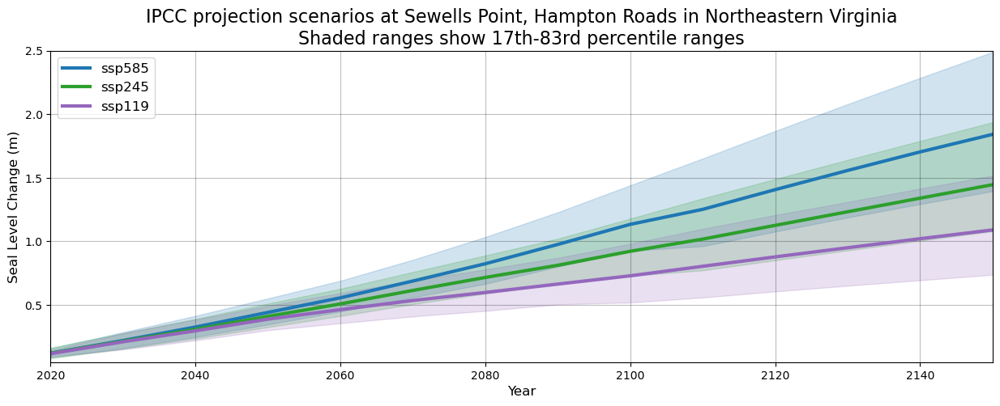

In [57]:
# Plot a subset of scenarios
scenario_subset = ['ssp119', 'ssp585', 'ssp245']
plotting.ipcc_plot(ipcc_results, scenario_subset, name = 'Sewells Point, Hampton Roads in Northeastern Virginia')

# U.S. SEA LEVEL RISE INTERAGENCY TASK FORCE TOOL

We can combine tide gauge observational data with projections

In [58]:
params = {
    'psmsl_id': ne_va_id,
    'task_force': 'true'
}
taskforce_base_url = 'https://sealevel-dataservices.jpl.nasa.gov/edge/ws/search/projection'
r = requests.get(f'{taskforce_base_url}', params=params).json()

In [59]:
taskforce_results = processing.prep_taskforce(r)

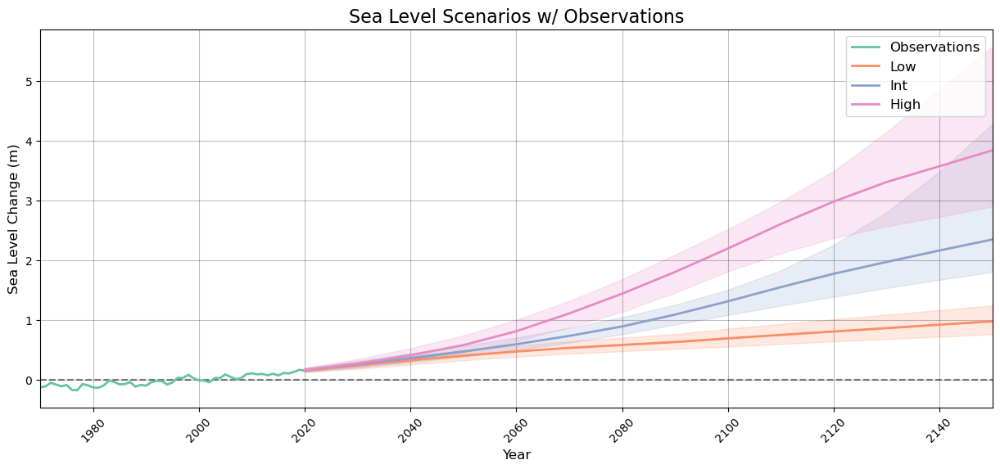

In [60]:
subset = ['Observations', 'Low', 'Int', 'High']
plotting.taskforce_plot(taskforce_results, subset=subset)